# NYC Trash Pick Up 11215 Analysis 

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import gmaps
import APIkeys
import ipywidgets as widgets

key = APIkeys.javascript_API_key
gmaps.configure(api_key=key)

Above, we import standard tools such as pandas for creating dataframes and matplotlib for plotting. We also use gmaps and ipywidgets to get inline googlemaps plots. You will need your own googlemaps API key in order to run this on your own.

Next, we load our address csv. 
The addresses were gotten from melissadata.com, the trash days were scraped from the NYC DOT website using scrape.py, and the latitude and longitude for each address was geocoded using geocode.py

In [2]:
address_df = pd.read_csv("address_df.csv")
address_df.head(5)

,address,trash_day,lat,lng
0,"1 10th St, Brooklyn, NY, USA",MON,40.672499,-73.994799
1,"1 10th St, Brooklyn, NY, USA",THU,40.672499,-73.994799
2,"1 12th St, Brooklyn, NY, USA",MON,40.671496,-73.996337
3,"1 12th St, Brooklyn, NY, USA",THU,40.671496,-73.996337
4,"1 2nd Ave, Brooklyn, NY, USA",MON,40.648758,-74.017147


We need to clean the table before analyzing, to get rid of any addresses that failed to geocode (where geocode.py returned None)

In [3]:
address_df.isnull().any()

address      False
trash_day    False
lat           True
lng           True
dtype: bool

In [4]:
address_df = address_df.dropna(how='any')
address_df.isnull().any()

address      False
trash_day    False
lat          False
lng          False
dtype: bool

## Basic Analysis

From a quick glance at the frequency of the trash days, we can infer that the addresses are paired Mon/Thu, Tue/Fri, and Wed/Sat, and that also there is no trash pick up on Sunday.

THU    1100
MON    1097
SAT     815
WED     814
FRI     447
TUE     446
Name: trash_day, dtype: int64


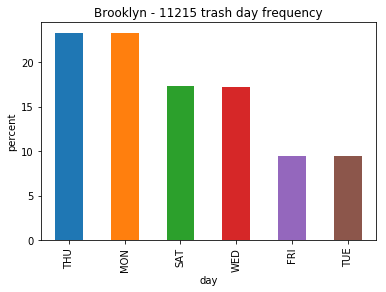

In [11]:
print(address_df['trash_day'].value_counts())

(address_df['trash_day'].value_counts()/len(address_df)*100).plot.bar()
plt.title('Brooklyn - 11215 trash day frequency')
plt.ylabel('percent')
plt.xlabel('day')
plt.show()

## Scatter Plot

We can refrain from plotting every day on the map, and instead can just plot mon, tue, wed.

I initially thought that a garbage truck would drive up and down an entire street (i.e. on 9th street all the way up to the park), but it seems that they zig zag in smaller quadrants.

In [6]:
day_dict = {'MON':'green','TUE':'red','WED':'blue'}
fig = gmaps.figure()
legend_entries = []

legend_template = '<span style="color: {color}; font-size: 2em; vertical-align: bottom;">&#9679;</span> {day}'


for day in day_dict:
    df = address_df[address_df['trash_day'] == day]
    df = df[['lat', 'lng']]

    layer = gmaps.symbol_layer(
        df, fill_color=day_dict[day],stroke_color=day_dict[day],scale=1
    )
    
    legend_entries.append(legend_template.format(color=day_dict[day], day=day))
    
    fig.add_layer(layer)
    
legend = widgets.HBox(
    [widgets.HTML(legend_entry) for legend_entry in legend_entries],
    layout=widgets.Layout(width='100%', justify_content='space-between')
)
    
widgets.VBox([fig, legend])

VBox(children=(Figure(layout=FigureLayout(height=u'420px')), HBox(children=(HTML(value=u'<span style="color: blue; font-size: 2em; vertical-align: bottom;">&#9679;</span> WED'), HTML(value=u'<span style="color: green; font-size: 2em; vertical-align: bottom;">&#9679;</span> MON'), HTML(value=u'<span style="color: red; font-size: 2em; vertical-align: bottom;">&#9679;</span> TUE')), layout=Layout(justify_content=u'space-between', width=u'100%'))))

Here, we just double check to make sure that the map is exactly the same for thu/fri/sat than it is for mon/tue/wed.

In [7]:
day_dict = {'THU':'green','FRI':'red','SAT':'blue'}
fig = gmaps.figure()
legend_entries = []

legend_template = '<span style="color: {color}; font-size: 2em; vertical-align: bottom;">&#9679;</span> {day}'


for day in day_dict:
    df = address_df[address_df['trash_day'] == day]
    df = df[['lat', 'lng']]

    layer = gmaps.symbol_layer(
        df, fill_color=day_dict[day],stroke_color=day_dict[day],scale=1
    )
    
    legend_entries.append(legend_template.format(color=day_dict[day], day=day))
    
    fig.add_layer(layer)
    
legend = widgets.HBox(
    [widgets.HTML(legend_entry) for legend_entry in legend_entries],
    layout=widgets.Layout(width='100%', justify_content='space-between')
)
    
widgets.VBox([fig, legend])

VBox(children=(Figure(layout=FigureLayout(height=u'420px')), HBox(children=(HTML(value=u'<span style="color: green; font-size: 2em; vertical-align: bottom;">&#9679;</span> THU'), HTML(value=u'<span style="color: red; font-size: 2em; vertical-align: bottom;">&#9679;</span> FRI'), HTML(value=u'<span style="color: blue; font-size: 2em; vertical-align: bottom;">&#9679;</span> SAT')), layout=Layout(justify_content=u'space-between', width=u'100%'))))